<a href="https://colab.research.google.com/github/Kala-Ayush/Data-Analysis/blob/main/Job_Data_Analysis_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import requests
import json
import pandas as pd

In [ ]:
request_url = "https://devitjobs.com/api/jobsLight"
response = requests.get(request_url)
data = json.loads(response.text)

In [ ]:
print("Total number of jobs currently listed: " + str(len(data)))

Total number of jobs currently listed: 2237


In [ ]:
df = pd.DataFrame(data)
#print(df)
df.head()

,_id,jobUrl,isFullRemote,isPartner,isPaused,companyId,longitude,latitude,cityCategory,stateCategory,...,jobType,expLevel,annualSalaryFrom,annualSalaryTo,techCategory,technologies,filterTags,cpc,disableMethodology,expiresOn
0,656e3a6c22593b9b69cd763d,NinjaTrader-Project-Manager,True,False,False,656e289f1aca4c8de7cbbbe4,-87.633246,41.886509,Chicago,Illinois,...,Full-Time,Senior,100000.0,120000.0,Business,"[Confluence, JIRA, Project Manager]","[Confluence, JIRA, Project Manager, React]",NaN,NaN,NaN
1,656e3a7422593b9b69cd7641,NinjaTrader-Sr-Mobile-Engineer---Flutter,True,False,False,656e289f1aca4c8de7cbbbe4,-87.633246,41.886509,Chicago,Illinois,...,Full-Time,Senior,120000.0,145000.0,Mobile,"[Dart, Flutter, Git, Mobile, OOP, REST, Web, U...","[Dart, Flutter, Git, Mobile, OOP, REST, React,...",NaN,NaN,NaN
2,65549da5f40d53bfe67bc583,In-Depth-Engineering-Corporation-Platform-Engi...,False,True,False,NaN,-74.890961,39.934183,Toms-River,New-Jersey,...,Full-Time,Regular,90000.0,120000.0,DevOps,"[AWS, Ansible, BitBucket, CI/CD, Cloud, Conflu...","[AWS, Ansible, Azure, BitBucket, CI/CD, Cloud,...",2.0,True,NaN
3,655dd7542208b98f09ed57a9,ENSCO-Inc-ESS-System-Integration-Engineer,False,True,False,NaN,-118.395276,33.919115,Los-Angeles,California,...,Full-Time,Senior,95000.0,125000.0,System,"[Confluence, JIRA, Security]","[Confluence, JIRA, Security]",2.0,True,NaN
4,651199abf5c5a1ec024f47a1,ENSCO-Inc-Ruggedized-Network-Switch-Developer,True,True,False,NaN,-74.006015,40.712728,New-York-City,New-York,...,Full-Time,Senior,69312.0,125010.0,IT,"[Embedded, Ethernet, Hardware, Linux, Network,...","[Embedded, Ethernet, Hardware, Linux, Network,...",2.0,True,NaN


In [ ]:
df.to_csv('job_data.csv', index=False)

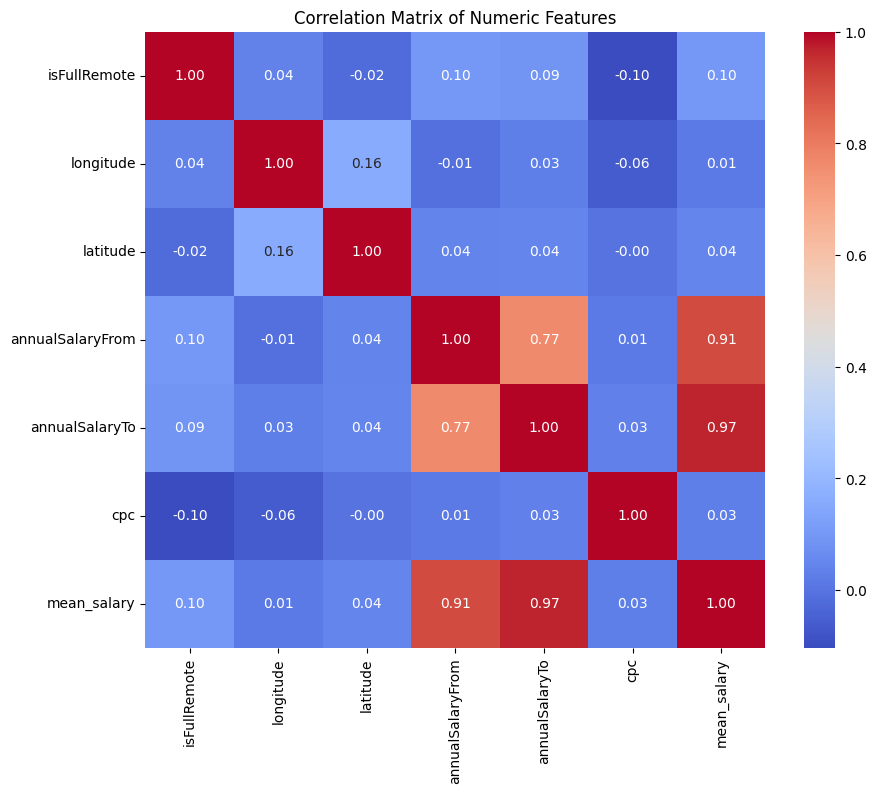

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

df['mean_salary'] = df[['annualSalaryFrom', 'annualSalaryTo']].mean(axis=1)

df['isFullRemote'] = df['isFullRemote'].astype(int)

df = df.drop(columns=['expiresOn'])

numeric_columns = df.select_dtypes(include=[np.number]).columns.tolist()

correlation_matrix = df[numeric_columns].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', cbar=True)
plt.title('Correlation Matrix of Numeric Features')
plt.show()


<ipython-input-7-b417ad502754>:62: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



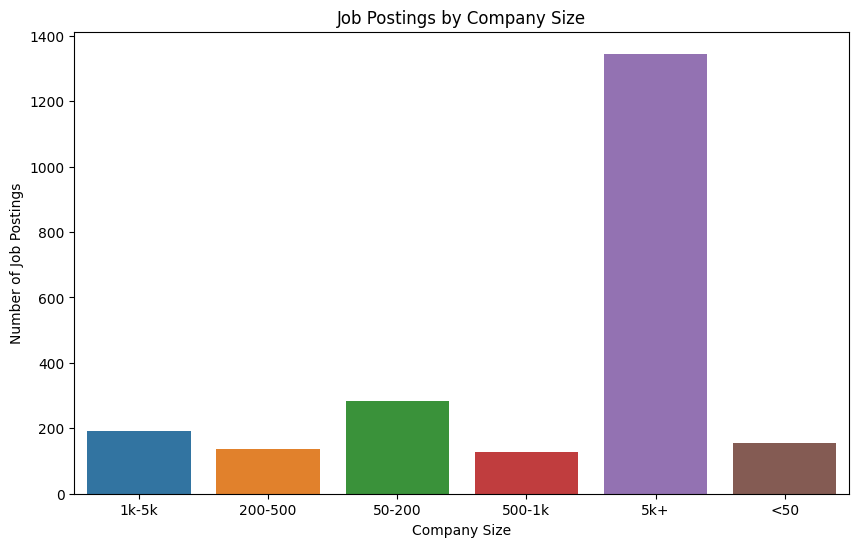

,_id,jobUrl,isFullRemote,isPartner,isPaused,companyId,longitude,latitude,cityCategory,stateCategory,...,annualSalaryFrom,annualSalaryTo,techCategory,technologies,filterTags,cpc,disableMethodology,mean_salary,meanSalary,stateAbbreviation
0,656e3a6c22593b9b69cd763d,NinjaTrader-Project-Manager,1,False,False,656e289f1aca4c8de7cbbbe4,-87.633246,41.886509,Chicago,Illinois,...,100000.0,120000.0,Business,"[Confluence, JIRA, Project Manager]","[Confluence, JIRA, Project Manager, React]",NaN,NaN,110000.0,110000.0,IL
1,656e3a7422593b9b69cd7641,NinjaTrader-Sr-Mobile-Engineer---Flutter,1,False,False,656e289f1aca4c8de7cbbbe4,-87.633246,41.886509,Chicago,Illinois,...,120000.0,145000.0,Mobile,"[Dart, Flutter, Git, Mobile, OOP, REST, Web, U...","[Dart, Flutter, Git, Mobile, OOP, REST, React,...",NaN,NaN,132500.0,132500.0,IL
2,65549da5f40d53bfe67bc583,In-Depth-Engineering-Corporation-Platform-Engi...,0,True,False,NaN,-74.890961,39.934183,Toms-River,New-Jersey,...,90000.0,120000.0,DevOps,"[AWS, Ansible, BitBucket, CI/CD, Cloud, Conflu...","[AWS, Ansible, Azure, BitBucket, CI/CD, Cloud,...",2.0,True,105000.0,105000.0,NJ
3,655dd7542208b98f09ed57a9,ENSCO-Inc-ESS-System-Integration-Engineer,0,True,False,NaN,-118.395276,33.919115,Los-Angeles,California,...,95000.0,125000.0,System,"[Confluence, JIRA, Security]","[Confluence, JIRA, Security]",2.0,True,110000.0,110000.0,CA
4,651199abf5c5a1ec024f47a1,ENSCO-Inc-Ruggedized-Network-Switch-Developer,1,True,False,NaN,-74.006015,40.712728,New-York-City,New-York,...,69312.0,125010.0,IT,"[Embedded, Ethernet, Hardware, Linux, Network,...","[Embedded, Ethernet, Hardware, Linux, Network,...",2.0,True,97161.0,97161.0,NY


In [ ]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from datetime import datetime

total_jobs = len(df)
job_distribution = df['jobType'].value_counts()
experience_distribution = df['expLevel'].value_counts()

top_companies = df['company'].value_counts().head(10)
company_type_distribution = df['companyType'].value_counts()
company_size_distribution = df['companySize'].value_counts()

#salary_stats = df.groupby('jobType')['annualSalaryFrom'].agg(['mean', 'min', 'max'])
#salary_distribution = px.histogram(df, x='annualSalaryFrom', nbins=20, title='Salary Distribution')

df['meanSalary'] = (df['annualSalaryFrom'] + df['annualSalaryTo']) / 2
df.head()

import plotly.express as px

mean_salaries = df['meanSalary']

fig = px.histogram(df, x='meanSalary', nbins=20, color='meanSalary',
                   title='Distribution of Mean Salaries')

fig.update_layout(
    xaxis_title='Mean Salary',
    yaxis_title='Frequency',
    showlegend=False
)

fig.show()

tech_distribution = df['techCategory'].value_counts()

# Remote Work Opportunities
remote_percentage = (df['isFullRemote'].sum() / total_jobs) * 100
remote_distribution = px.pie(df, names='isFullRemote', title='Remote Work Opportunities')

# Visa Sponsorship Analysis
visa_distribution = px.pie(df, names='hasVisaSponsorship', title='Visa Sponsorship Distribution')

# Remote Work Opportunities
remote_percentage = (df['isFullRemote'].sum() / total_jobs) * 100
remote_distribution = px.pie(df, names='isFullRemote', title='Remote Work Opportunities')

# Job Title and Skill Analysis
common_job_titles = df['name'].value_counts().head(10)
word_cloud_skills = df['technologies'].explode().value_counts()

import plotly.express as px

# Interactive Map focused on the United States
map_fig = px.scatter_geo(df, lat='latitude', lon='longitude', hover_name='name', color='cityCategory',
                         title='Job Locations in the United States',
                         scope='usa')  # Set scope to 'usa' for focusing on the United States


# Correlation Analysis
correlation_matrix = df[['annualSalaryFrom', 'expLevel']].corr()

company_size_group = df.groupby('companySize')
job_postings_count = company_size_group.size()
salary_by_size = company_size_group['mean_salary'].mean()
exp_by_size = company_size_group['expLevel'].value_counts()
remote_by_size = company_size_group['isFullRemote'].value_counts()

plt.figure(figsize=(10, 6))
sns.barplot(x=job_postings_count.index, y=job_postings_count.values)
plt.title('Job Postings by Company Size')
plt.xlabel('Company Size')
plt.ylabel('Number of Job Postings')
plt.show()

# Data Visualization
remote_distribution.show()
visa_distribution.show()

map_fig.show()

# Heat-map of job counts by each state

import plotly.express as px

# state abbreviations
state_abbreviations = {
    'Alabama': 'AL',
    'Alaska': 'AK',
    'Arizona': 'AZ',
    'Arkansas': 'AR',
    'California': 'CA',
    'Colorado': 'CO',
    'Connecticut': 'CT',
    'District-Of-Columbia': 'DC',
    'Delaware': 'DE',
    'Florida': 'FL',
    'Georgia': 'GA',
    'Hawaii': 'HI',
    'Idaho': 'ID',
    'Illinois': 'IL',
    'Indiana': 'IN',
    'Iowa': 'IA',
    'Kansas': 'KS',
    'Kentucky': 'KY',
    'Louisiana': 'LA',
    'Maine': 'ME',
    'Maryland': 'MD',
    'Massachusetts': 'MA',
    'Michigan': 'MI',
    'Minnesota': 'MN',
    'Mississippi': 'MS',
    'Missouri': 'MO',
    'Montana': 'MT',
    'Nebraska': 'NE',
    'Nevada': 'NV',
    'New-Hampshire': 'NH',
    'New-Jersey': 'NJ',
    'New-Mexico': 'NM',
    'New-York': 'NY',
    'North-Carolina': 'NC',
    'North-Dakota': 'ND',
    'Ohio': 'OH',
    'Oklahoma': 'OK',
    'Oregon': 'OR',
    'Pennsylvania': 'PA',
    'Rhode-Island': 'RI',
    'South-Carolina': 'SC',
    'South-Dakota': 'SD',
    'Tennessee': 'TN',
    'Texas': 'TX',
    'Utah': 'UT',
    'Vermont': 'VT',
    'Virginia': 'VA',
    'Washington': 'WA',
    'West-Virginia': 'WV',
    'Wisconsin': 'WI',
    'Wyoming': 'WY'

}

df['stateAbbreviation'] = df['stateCategory'].map(state_abbreviations)

# Calculate job count by state
state_job_count = df['stateAbbreviation'].value_counts().reset_index()
state_job_count.columns = ['stateAbbreviation', 'Job Count']

# Choropleth Map of Job Count by State
choropleth_fig = px.choropleth(state_job_count,
                               locations='stateAbbreviation',
                               color='Job Count',
                               locationmode='USA-states',
                               title='Job Count by State',
                               labels={'Job Count': 'Job Count'},
                               scope="usa")

choropleth_fig.show()
df.head()

Top 10 In-Demand Skills:
1.Security
2.HTTP
3.Cloud
4.Python
5.Hardware
6.Web
7.Java
8.Linux
9.Network
10.DevOps


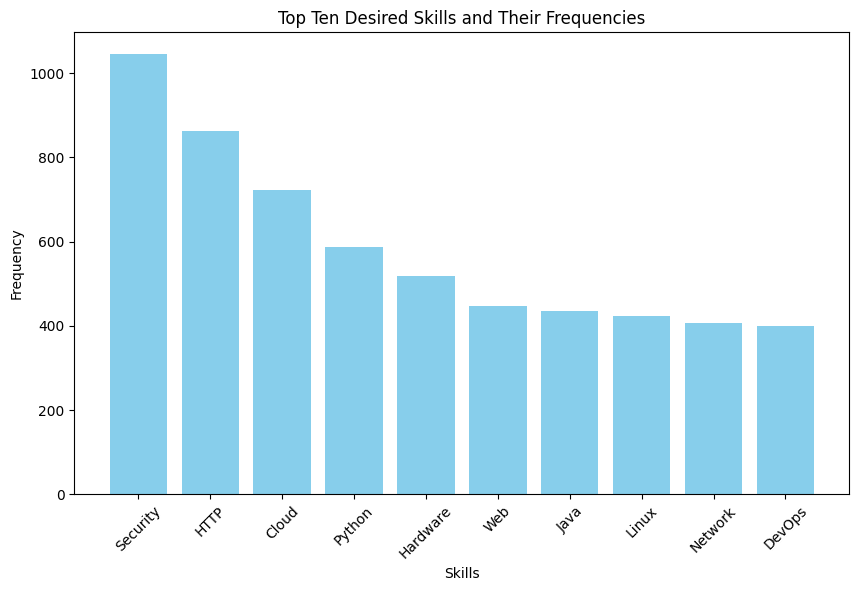

In [ ]:
from collections import Counter

all_skills = [skill for skills_list in df["filterTags"] for skill in skills_list]

skill_counts = Counter(all_skills)

sorted_skills = sorted(skill_counts.items(), key=lambda x: x[1], reverse=True)

print("Top 10 In-Demand Skills:")
rank = 1
for skill, count in sorted_skills[:10]:
    print(str(rank)+"."+f"{skill}")
    rank = rank + 1

top_10_skills = dict(sorted_skills[:10])
plt.figure(figsize=(10, 6))
plt.bar(top_10_skills.keys(), top_10_skills.values(), color='skyblue')
plt.xlabel('Skills')
plt.ylabel('Frequency')
plt.title('Top Ten Desired Skills and Their Frequencies')
plt.xticks(rotation=45)
plt.show()


In [ ]:
import pandas as pd

df['mean_salary'] = df['mean_salary'].round(0)

from tabulate import tabulate

df['mean_salary'] = df[['annualSalaryFrom', 'annualSalaryTo']].mean(axis=1).round(0)

# Group by experience level and calculate mean salary
salary_by_exp = df.groupby('expLevel')['mean_salary'].mean().round(0)

# Group by job type and calculate mean salary
salary_by_jobtype = df.groupby('jobType')['mean_salary'].mean().round(0)

# Group by tech category and calculate mean salary
salary_by_tech = df.groupby('techCategory')['mean_salary'].mean().round(0)

# Displaying the results in a formatted table using tabulate
print("Salary by Experience Level:")
print(tabulate(salary_by_exp.to_frame('Mean Salary'), headers='keys', tablefmt='psql'))

print("\nSalary by Job Type:")
print(tabulate(salary_by_jobtype.to_frame('Mean Salary'), headers='keys', tablefmt='psql'))

print("\nSalary by Tech Category:")
print(tabulate(salary_by_tech.to_frame('Mean Salary'), headers='keys', tablefmt='psql'))


Salary by Experience Level:
+------------+---------------+
| expLevel   |   Mean Salary |
|------------+---------------|
| Junior     |         97379 |
| Lead       |        134559 |
| Regular    |        118925 |
| Senior     |        140264 |
+------------+---------------+

Salary by Job Type:
+------------+---------------+
| jobType    |   Mean Salary |
|------------+---------------|
| Contract   |        145754 |
| Full-Time  |        129411 |
| Internship |         90800 |
| Part-Time  |        123126 |
+------------+---------------+

Salary by Tech Category:
+------------------+---------------+
| techCategory     |   Mean Salary |
|------------------+---------------|
| Architect        |        146542 |
| Blockchain       |        150800 |
| Business         |        129154 |
| C++              |        135474 |
| Data             |        137889 |
| Database         |        120700 |
| DevOps           |        135874 |
| GameDev          |        119383 |
| Golang           |  

In [ ]:
import pandas as pd
import plotly.express as px

df['mean_salary'] = df[['annualSalaryFrom', 'annualSalaryTo']].mean(axis=1)

salary_by_exp = df.groupby('expLevel')['mean_salary'].mean().reset_index()

salary_by_jobtype = df.groupby('jobType')['mean_salary'].mean().reset_index()

salary_by_tech = df.groupby('techCategory')['mean_salary'].mean().reset_index()

color_sequence = px.colors.qualitative.Set2

fig1 = px.bar(salary_by_exp, x='expLevel', y='mean_salary', title='Average Salary by Experience Level',
              color='expLevel', color_discrete_sequence=color_sequence)
fig2 = px.bar(salary_by_jobtype, x='jobType', y='mean_salary', title='Average Salary by Job Type',
              color='jobType', color_discrete_sequence=color_sequence)
fig3 = px.bar(salary_by_tech, x='techCategory', y='mean_salary', title='Average Salary by Tech Category',
              color='techCategory', color_discrete_sequence=color_sequence)

layout_kwargs = {
    'xaxis_title': 'Category',
    'yaxis_title': 'Average Salary',
    'barmode': 'group',
    'template': 'plotly_white',
    'autosize': True,
    'height': 500,
    'margin': dict(l=40, r=40, t=40, b=40),
    'hovermode': 'closest'
}

fig1.update_layout(**layout_kwargs)
fig2.update_layout(**layout_kwargs)
fig3.update_layout(**layout_kwargs)

bar_kwargs = {
    'marker': dict(line=dict(color='#000000', width=1)),
    'opacity': 0.8
}

fig1.update_traces(**bar_kwargs)
fig2.update_traces(**bar_kwargs)
fig3.update_traces(**bar_kwargs)

fig1.show()
fig2.show()
fig3.show()


In [ ]:
import plotly.express as px

fig4 = px.violin(df, x='expLevel', y='mean_salary', title='Salary Distribution by Experience Level (Violin Plot)')
fig5 = px.violin(df, x='jobType', y='mean_salary', title='Salary Distribution by Job Type (Violin Plot)')

fig4.show()
fig5.show()


__DATA STORY__



1. PASSIONATE ABOUT COMPANY

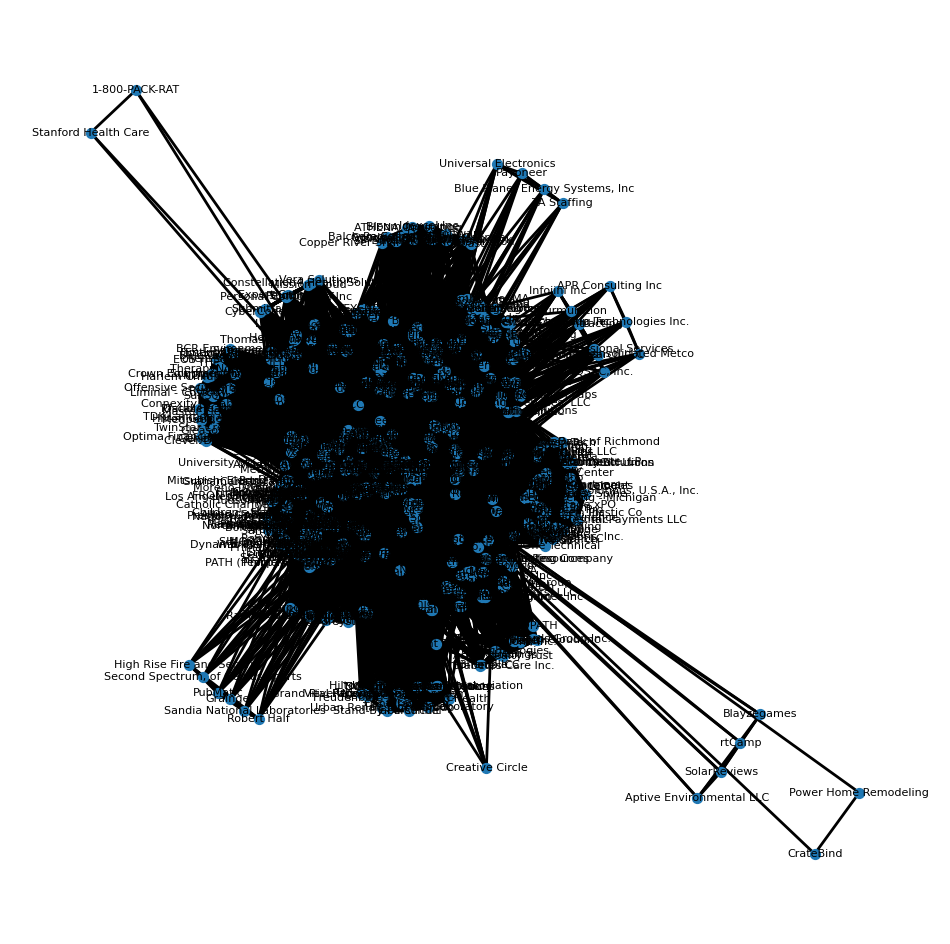

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

tech_df = df[['company', 'techCategory']].drop_duplicates()

G = nx.Graph()
for company in tech_df['company'].unique():
    G.add_node(company, label=company)
for category in tech_df['techCategory'].unique():
    companies_with_category = tech_df[tech_df['techCategory'] == category]['company'].unique()

    for i in range(len(companies_with_category)):
        for j in range(i+1, len(companies_with_category)):
            G.add_edge(companies_with_category[i], companies_with_category[j], label=category)

plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos, node_size=50)
nx.draw_networkx_edges(G, pos, width=2)
nx.draw_networkx_labels(G, pos, font_size=8, font_family='sans-serif')

plt.axis('off')
plt.show()


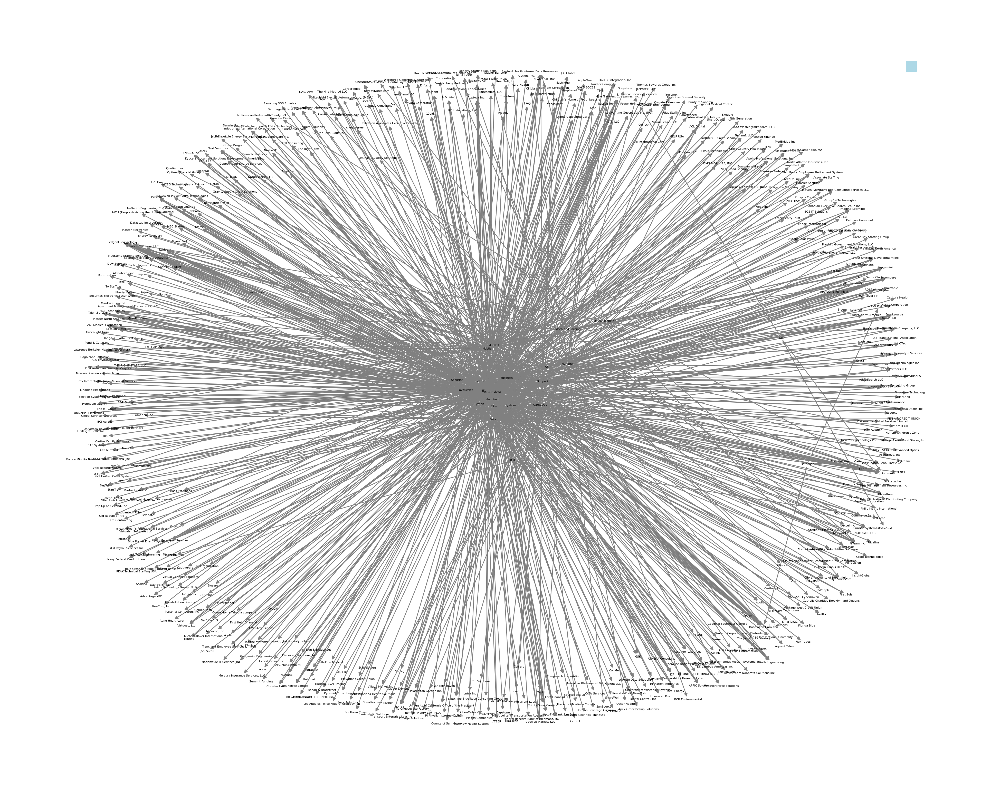

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

tech_df = df[['company', 'techCategory']].drop_duplicates()

G = nx.DiGraph()
for _, row in tech_df.iterrows():
    G.add_node(row['company'], shape='rect', label=row['company'])
    G.add_node(row['techCategory'], shape='ellipse', label=row['techCategory'])
    G.add_edge(row['techCategory'], row['company'])
plt.figure(figsize=(50, 40))

node_shapes = {'rect': 's', 'ellipse': 'o'}
node_colors = {'rect': 'lightblue', 'ellipse': 'lightgreen'}
for node, data in G.nodes(data=True):
    nx.draw_networkx_nodes(G, pos={node: (1, 1)}, nodelist=[node],
                           node_shape=node_shapes[data['shape']],
                           node_color=node_colors[data['shape']],
                           node_size=800, label=data['label'])

nx.draw_networkx_edges(G, pos=nx.spring_layout(G, seed=42), width=2, edge_color='gray', arrowsize=20)

labels = {node: data['label'] for node, data in G.nodes(data=True)}
nx.draw_networkx_labels(G, pos=nx.spring_layout(G, seed=42), labels=labels, font_size=8, font_family='sans-serif')

plt.axis('off')
plt.show()

In [ ]:
import plotly.graph_objs as go
import networkx as nx

G = nx.Graph()
for company in tech_df['company'].unique():
    G.add_node(company)
for category in tech_df['techCategory'].unique():
    companies_with_category = tech_df[tech_df['techCategory'] == category]['company'].unique()
    for i in range(len(companies_with_category)):
        for j in range(i+1, len(companies_with_category)):
            G.add_edge(companies_with_category[i], companies_with_category[j])

pos = nx.spring_layout(G)

edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

node_x = []
node_y = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        size=10,
        color=[],
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

node_adjacencies = []
node_text = []
for node, adjacencies in enumerate(G.adjacency()):
    node_adjacencies.append(len(adjacencies[1]))
    node_text.append(adjacencies[0])

node_trace.marker.color = node_adjacencies
node_trace.text = node_text

fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title='<br>Network graph made with Plotly',
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20,l=5,r=5,t=40),
                    annotations=[dict(
                        text="Python code to plot a network graph with Plotly",
                        showarrow=False,
                        xref="paper", yref="paper",
                        x=0.005, y=-0.002)],
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )

fig.show()

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, clear_output

company_list = df['company'].unique().tolist()
dropdown_company = widgets.Dropdown(options=company_list, value=company_list[0], description='Select Company:')


def find_similar_companies_and_shared_tech(company, G, df, num_neighbors=5):

    if company not in G:
        return "Company not found in the graph."

    neighbors = list(G.neighbors(company))

    company_techs = set(df[df['company'] == company]['techCategory'])
    similar_companies = {}
    for neighbor in neighbors:
        neighbor_techs = set(df[df['company'] == neighbor]['techCategory'])
        shared_techs = company_techs.intersection(neighbor_techs)
        similar_companies[neighbor] = list(shared_techs)

    sorted_similar_companies = dict(sorted(similar_companies.items(), key=lambda item: len(item[1]), reverse=True))

    return dict(list(sorted_similar_companies.items())[:num_neighbors])


display_button = widgets.Button(description='Display Similar Companies')

similar_companies_with_shared_tech = {}

def display_similar_companies(b):
    global similar_companies_with_shared_tech
    selected_company = dropdown_company.value
    similar_companies_with_shared_tech = find_similar_companies_and_shared_tech(selected_company, G, df)
    clear_output(wait=True)
    print(f"Similar companies for {selected_company}:")
    print(similar_companies_with_shared_tech)

display_button.on_click(display_similar_companies)

display(dropdown_company)
display(display_button)


Dropdown(description='Select Company:', options=('NinjaTrader', 'In-Depth Engineering Corporation', 'ENSCO, In…

Button(description='Display Similar Companies', style=ButtonStyle())

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, clear_output

similar_companies_list = list(similar_companies_with_shared_tech.keys())

company_dropdown = widgets.Dropdown(
    options=similar_companies_list,
    value=similar_companies_list[0],
    description='Select a company:'
)

job_roles_list = []

job_roles_multi_select = widgets.SelectMultiple(
    options=job_roles_list,
    value=[],
    description='Select job role(s):'
)

display_button = widgets.Button(description='Display Analysis')

def update_job_roles(change):
    selected_company = change.new
    if selected_company in similar_companies_with_shared_tech:
        job_roles_options = df[df['company'] == selected_company]['name'].unique()
        job_roles_multi_select.options = job_roles_options
        job_roles_multi_select.value = [job_roles_options[0]]  # Set default value

def display_analysis(b):
    clear_output(wait=True)
    selected_company = company_dropdown.value
    selected_job_roles = job_roles_multi_select.value

    for company, shared_techs in similar_companies_with_shared_tech.items():
        if company == selected_company:
            print(f"Analysis for {company}:")

            highest_salary_job_role = None
            highest_salary = 0

            for job_role in selected_job_roles:
                print(f"\nDetails for job role '{job_role}':")

                # Location for the specific job role
                location = df[(df['company'] == company) & (df['name'] == job_role)]['stateCategory'].unique()
                print(f"Location: {', '.join(location)}")

                # Mean salary for the specific job role
                mean_salary = df[(df['company'] == company) & (df['name'] == job_role)]['mean_salary'].mean()
                print(f"Mean Salary: {mean_salary}")

                # Check if this job role has a higher mean salary
                if mean_salary > highest_salary:
                    highest_salary = mean_salary
                    highest_salary_job_role = job_role

                # Visa for the specific job role
                visa = df[(df['company'] == company) & (df['name'] == job_role)]['hasVisaSponsorship'].unique()
                print(f"Visa: {', '.join(visa)}")

                # Filter tags for the specific job role
                filter_tags_job_role = df[(df['company'] == company) & (df['name'] == job_role)]['filterTags'].explode().astype(str).unique()
                print(f"Preferred skills needed to succeed in the job: {', '.join(filter_tags_job_role)}")

                # Perks offered for the specific job role
                perks_offered_job_role = df[(df['company'] == company) & (df['name'] == job_role)]['perkKeys'].explode().astype(str).unique()
                print(f"Perks offered: {', '.join(perks_offered_job_role)}")
                print("-" * 50)

            if highest_salary_job_role:
                print(f"\nJob role with the highest mean salary: '{highest_salary_job_role}'")
                print(f"Highest Mean Salary: {highest_salary}")

company_dropdown.observe(update_job_roles, names='value')
display_button.on_click(display_analysis)

display(company_dropdown)
display(job_roles_multi_select)
display(display_button)

IndexError: ignored

2. PASSIONATE ABOUT TECHNOLOGY/SET OF TECHNOLOGIES


In [ ]:
import pandas as pd
import ipywidgets as widgets
from IPython.display import display

tech_categories = df['techCategory'].explode().unique()

tech_dropdown = widgets.SelectMultiple(
    options=['All'] + list(tech_categories),
    value=['All'],
    description='Technology:',
)

state_categories = df['stateCategory'].unique()

state_dropdown = widgets.SelectMultiple(
    options=['All'] + list(state_categories),
    value=['All'],
    description='State:',
)

display_button = widgets.Button(
    description="Display Analysis",
    button_style="success"
)

display(tech_dropdown)
display(state_dropdown)
display(display_button)

def filter_roles(selected_technologies, selected_states):
    roles_filtered_by_tech = df.copy()

    if 'All' not in selected_technologies:
        roles_filtered_by_tech = roles_filtered_by_tech[roles_filtered_by_tech['techCategory'].apply(lambda x: any(tech in x for tech in selected_technologies))]

    roles_filtered_by_state = roles_filtered_by_tech if 'All' in selected_states else roles_filtered_by_tech[roles_filtered_by_tech['stateCategory'].isin(selected_states)]
    return roles_filtered_by_state

# Function to display job role details
def display_job_role_details(company, selected_job_roles):
    for job_role in selected_job_roles:
        print(f"\nDetails for job role '{job_role}':")

        # Company for the specific job role
        role_company = df.loc[df['name'] == job_role, 'company'].iloc[0]
        print(f"Company: {role_company}")

        # Mean salary for the specific job role
        mean_salary = df.loc[df['name'] == job_role, 'mean_salary'].mean()
        print(f"Mean Salary: {mean_salary}")

        # Visa for the specific job role
        visa = df.loc[df['name'] == job_role, 'hasVisaSponsorship'].unique()
        print(f"Visa: {', '.join(visa)}")

        # Perks offered for the specific job role
        perks_offered_job_role = df.loc[df['name'] == job_role, 'perkKeys'].explode().astype(str).unique()
        print(f"Perks offered: {', '.join(perks_offered_job_role)}")

def on_display_button_click(b):
    selected_technologies = tech_dropdown.value
    selected_states = state_dropdown.value

    filtered_roles = filter_roles(selected_technologies, selected_states)

    if filtered_roles.empty:
        print("No roles found for the selected technologies and states.")
        return

    print("\nAnalysis Results:")

    selected_job_roles = filtered_roles['name'].tolist()

    for job_role in selected_job_roles:
        display_job_role_details(company, [job_role])

display_button.on_click(on_display_button_click)